# Hierarchical Clustering - Dendrograms Using Scipy and Scikit-learn in Python - Tutorial 24

In [ ]:
# https://www.youtube.com/watch?v=JcfIeaGzF8A

In [2]:
import numpy as np
import pandas as pd

#import scipy
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster ,cophenet
from scipy.spatial.distance import pdist
# cophenet =  comments     , dist = distance tools, 

from pylab import rcParams
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.plotly as py

from sklearn.cluster import AgglomerativeClustering  # Hierarchical Clustering
import sklearn.metrics as sm
%matplotlib inline

In [ ]:
np.set_printoptions(precision=4, suppress=True)
plt.figure(figsize=(10,3)) 
plt.style.use('seabron-whitegrid')

In [22]:
addresss = 'https://www.4shared.com/file/WRwKoPDaei/mtcars.html]mtcars.csv'
cars = pd.read_csv('mtcars.csv')

cars.columns = ['car_name','mpg','cyl','disp','hp','drat','wt','gsec','vs','am','gear','carb']
print(cars.head())
x = cars.ix[:,(1,2,3,4)].values
y = cars.ix[:,(9)].values

            car_name   mpg  cyl   disp   hp  drat     wt   gsec  vs  am  gear  \
0          Mazda RX4  21.0    6  160.0  110  3.90  2.620  16.46   0   1     4   
1      Mazda RX4 Wag  21.0    6  160.0  110  3.90  2.875  17.02   0   1     4   
2         Datsun 710  22.8    4  108.0   93  3.85  2.320  18.61   1   1     4   
3     Hornet 4 Drive  21.4    6  258.0  110  3.08  3.215  19.44   1   0     3   
4  Hornet Sportabout  18.7    8  360.0  175  3.15  3.440  17.02   0   0     3   

   carb  
0     4  
1     4  
2     1  
3     1  
4     2  


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  


In [47]:
print(y)

[1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 1 1 1 1 1 1 1]


# using scipy to generate dendrograms 

In [30]:
z = linkage(x,'ward')

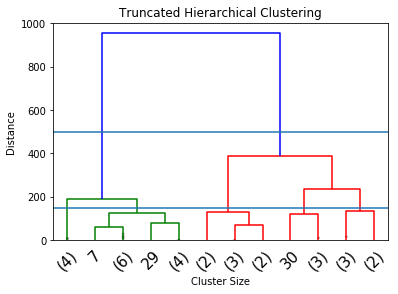

In [35]:
dendrogram(z, truncate_mode='lastp',p=12,leaf_rotation=45, leaf_font_size=15, show_contracted=2)
plt.title('Truncated Hierarchical Clustering')
plt.xlabel("Cluster Size")
plt.ylabel('Distance ')

plt.axhline(y=500) #how many group we have
plt.axhline(y=150)
# plt.axhline(y=250)

plt.show()

# use corrleation data of stcok market :::: 

In [40]:
G = pd.read_csv('stock_corrleation.csv',index_col=0)
G.head()

,MMM,ABT,ABBV,ABMD,ACN,ATVI,ADBE,AMD,AAP,AES,...,AZO,AVB,AVY,BHGE,BLL,BAC,BK,BAX,BBT,BDX
MMM,1.000000,0.774935,0.872149,0.712748,0.905510,0.907989,0.856825,0.838583,-0.813287,0.303873,...,-0.383979,0.520372,0.951815,-0.272875,0.800999,0.888451,0.884906,0.934751,0.864375,0.937421
ABT,0.774935,1.000000,0.933942,0.836050,0.803269,0.783432,0.881497,0.592280,-0.689990,0.437372,...,-0.467615,0.138184,0.809089,-0.213829,0.517356,0.861320,0.847718,0.825800,0.845286,0.809884
ABBV,0.872149,0.933942,1.000000,0.854479,0.904861,0.858054,0.915463,0.666159,-0.729494,0.375682,...,-0.341617,0.183465,0.915096,-0.331312,0.602355,0.892912,0.879070,0.891084,0.879731,0.889621
ABMD,0.712748,0.836050,0.854479,1.000000,0.892648,0.859318,0.959153,0.679716,-0.554705,0.436250,...,-0.246076,0.201000,0.829874,-0.327370,0.513952,0.809936,0.804565,0.871128,0.826953,0.869407
ACN,0.905510,0.803269,0.904861,0.892648,1.000000,0.958085,0.955145,0.807500,-0.697966,0.306061,...,-0.215584,0.419013,0.976278,-0.384035,0.707414,0.894993,0.903541,0.954924,0.892917,0.970077


In [29]:
z1 = linkage(G,method='single',optimal_ordering='bool')

In [32]:
G.ix[26,(27)]

0.9992010010599148

In [30]:
z1

array([[ 26.    ,  27.    ,   0.0878,   2.    ],
       [  1.    ,  53.    ,   0.2615,   2.    ],
       [ 45.    ,  20.    ,   0.2821,   2.    ],
       [ 13.    ,   0.    ,   0.348 ,   2.    ],
       [ 32.    ,  36.    ,   0.3769,   2.    ],
       [ 70.    ,  68.    ,   0.3893,   2.    ],
       [ 35.    ,   5.    ,   0.3979,   2.    ],
       [ 25.    ,  41.    ,   0.3986,   2.    ],
       [ 48.    ,  21.    ,   0.4055,   2.    ],
       [ 78.    ,  74.    ,   0.4076,   4.    ],
       [ 52.    ,  80.    ,   0.4144,   5.    ],
       [  6.    ,  29.    ,   0.4377,   2.    ],
       [ 75.    ,  24.    ,   0.4417,   3.    ],
       [ 76.    ,  12.    ,   0.4456,   3.    ],
       [ 77.    ,  84.    ,   0.448 ,   5.    ],
       [ 85.    ,  60.    ,   0.4487,   6.    ],
       [ 71.    ,   4.    ,   0.4568,   3.    ],
       [ 67.    ,  69.    ,   0.4622,   2.    ],
       [ 73.    ,  82.    ,   0.468 ,   4.    ],
       [ 87.    ,  86.    ,   0.4714,   9.    ],
       [ 47.    ,  9

In [193]:
G1 = 1.0/G
G1.head()

,MMM,ABT,ABBV,ABMD,ACN,ATVI,ADBE,AMD,AAP,AES,...,AZO,AVB,AVY,BHGE,BLL,BAC,BK,BAX,BBT,BDX
MMM,1.000000,1.290431,1.146593,1.403021,1.104350,1.101335,1.167100,1.192487,-1.229578,3.290844,...,-2.604309,1.921704,1.050625,-3.664678,1.248442,1.125554,1.130063,1.069803,1.156905,1.066757
ABT,1.290431,1.000000,1.070730,1.196100,1.244913,1.276435,1.134434,1.688390,-1.449297,2.286383,...,-2.138511,7.236753,1.235958,-4.676628,1.932903,1.161009,1.179638,1.210947,1.183031,1.234745
ABBV,1.146593,1.070730,1.000000,1.170303,1.105142,1.165427,1.092344,1.501143,-1.370813,2.661829,...,-2.927259,5.450644,1.092782,-3.018307,1.660150,1.119932,1.137565,1.122228,1.136711,1.124075
ABMD,1.403021,1.196100,1.170303,1.000000,1.120262,1.163714,1.042587,1.471203,-1.802759,2.292262,...,-4.063791,4.975132,1.205003,-3.054648,1.945705,1.234666,1.242908,1.147937,1.209258,1.150209
ACN,1.104350,1.244913,1.105142,1.120262,1.000000,1.043749,1.046962,1.238390,-1.432735,3.267323,...,-4.638569,2.386561,1.024299,-2.603931,1.413600,1.117327,1.106756,1.047204,1.119925,1.030846


In [58]:
import math
DD = pd.DataFrame()
DD = np.sqrt(2.0*(1.0-G))
DD.head()
#DD= math.sqrt(2.0*(1.0-G))

,MMM,ABT,ABBV,ABMD,ACN,ATVI,ADBE,AMD,AAP,AES,...,AZO,AVB,AVY,BHGE,BLL,BAC,BK,BAX,BBT,BDX
MMM,0.000000,0.670917,0.505669,0.757961,0.434718,0.428977,0.535117,0.568184,1.904357,1.179938,...,1.663718,0.979417,0.310436,1.595541,0.630875,0.472332,0.479778,0.361244,0.520816,0.353777
ABT,0.670917,0.000000,0.363477,0.572625,0.627265,0.658130,0.486833,0.903017,1.838472,1.060781,...,1.713251,1.312872,0.617918,1.558095,0.982490,0.526650,0.551874,0.590254,0.556262,0.616630
ABBV,0.505669,0.363477,0.000000,0.539482,0.436209,0.532814,0.411187,0.817118,1.859836,1.117424,...,1.638058,1.277917,0.412078,1.631755,0.891790,0.462792,0.491792,0.466724,0.490447,0.469850
ABMD,0.757961,0.572625,0.539482,0.000000,0.463361,0.530438,0.285822,0.800355,1.763352,1.061838,...,1.578655,1.264120,0.583312,1.629337,0.985949,0.616545,0.625196,0.507686,0.588297,0.511064
ACN,0.434718,0.627265,0.436209,0.463361,0.000000,0.289535,0.299517,0.620483,1.842805,1.178082,...,1.559220,1.077949,0.217818,1.663752,0.764966,0.458272,0.439224,0.300253,0.462780,0.244633


In [61]:
zd= linkage(DD,'ward')
print(zd)

[[2.60000000e+01 2.70000000e+01 1.35942461e-01 2.00000000e+00]
 [6.00000000e+00 2.00000000e+01 4.22461772e-01 2.00000000e+00]
 [6.80000000e+01 7.00000000e+01 4.37658731e-01 2.00000000e+00]
 [2.40000000e+01 3.60000000e+01 4.44801985e-01 2.00000000e+00]
 [1.30000000e+01 4.10000000e+01 5.04704001e-01 2.00000000e+00]
 [1.00000000e+00 5.30000000e+01 5.34700842e-01 2.00000000e+00]
 [2.50000000e+01 5.20000000e+01 5.51654149e-01 2.00000000e+00]
 [1.20000000e+01 7.30000000e+01 5.62244449e-01 3.00000000e+00]
 [3.50000000e+01 4.70000000e+01 5.69062518e-01 2.00000000e+00]
 [3.20000000e+01 7.40000000e+01 5.69141800e-01 3.00000000e+00]
 [6.70000000e+01 6.90000000e+01 5.77981170e-01 2.00000000e+00]
 [4.50000000e+01 7.20000000e+01 5.86165973e-01 3.00000000e+00]
 [4.30000000e+01 5.90000000e+01 6.18612399e-01 2.00000000e+00]
 [4.00000000e+00 5.00000000e+00 6.46502938e-01 2.00000000e+00]
 [7.50000000e+01 7.70000000e+01 6.92414119e-01 4.00000000e+00]
 [6.60000000e+01 8.10000000e+01 7.05715066e-01 3.000000

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



In [20]:
len(G.columns.values[:])

l = []
for i in G.columns.values[:]:
    l.append(i)

In [62]:
z = linkage(G1,'ward')
print()

In [10]:
np.set_printoptions(precision=4, suppress=True)
plt.figure(figsize=(15,3)) 
#plt.style.use('seabron-whitegrid')

In [7]:
#G.columns[0:70]
#z

In [181]:
keys = G.columns
values = [i for i in range(len(keys))]
ictionary = dict(zip(keys, values))
ic= pd.DataFrame(G.columns)
ic['id']= values
print(ic.ix[0])
print(ic.ix[13])


0     MMM
id      0
Name: 0, dtype: object
0      A
id    13
Name: 13, dtype: object


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: DeprecationWarning:


.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated



In [183]:
print(G.iloc[0][13])

0.973944930377


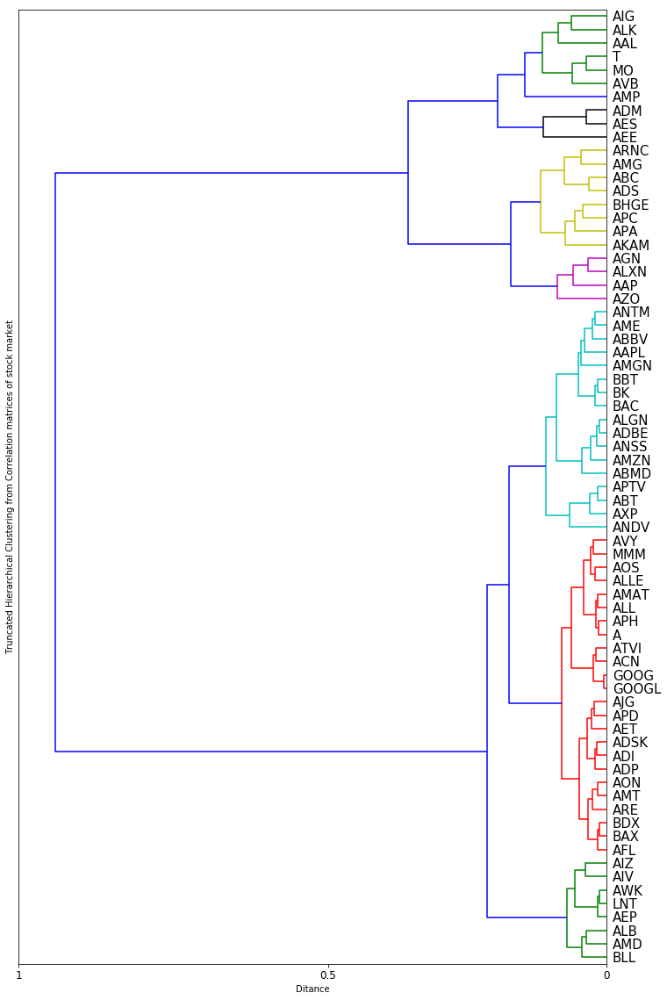

In [71]:
plt.figure(figsize=(12,20))

dendrogram(zd, truncate_mode='lastp',p=71,leaf_rotation=45, leaf_font_size=15, show_contracted=20,
           labels=l,color_threshold=5,orientation='left')#,link_color_func=lambda x: link_cols[x])above_threshold_color='grey'
#plt.title('Truncated Hierarchical Clustering from Correlation matrices of stock market')
plt.xlabel("Ditance")
plt.ylabel('Truncated Hierarchical Clustering from Correlation matrices of stock market')
plt.xticks([0,18,38],[0,0.5,1],fontsize=12,rotation='horizontal')#rotation='vertical'
plt.yticks(fontsize=15,rotation='horizontal')

#plt.axhline(y=5) #how many group we have
#plt.axhline(y=150)
# plt.axhline(y=250)






plt.show()

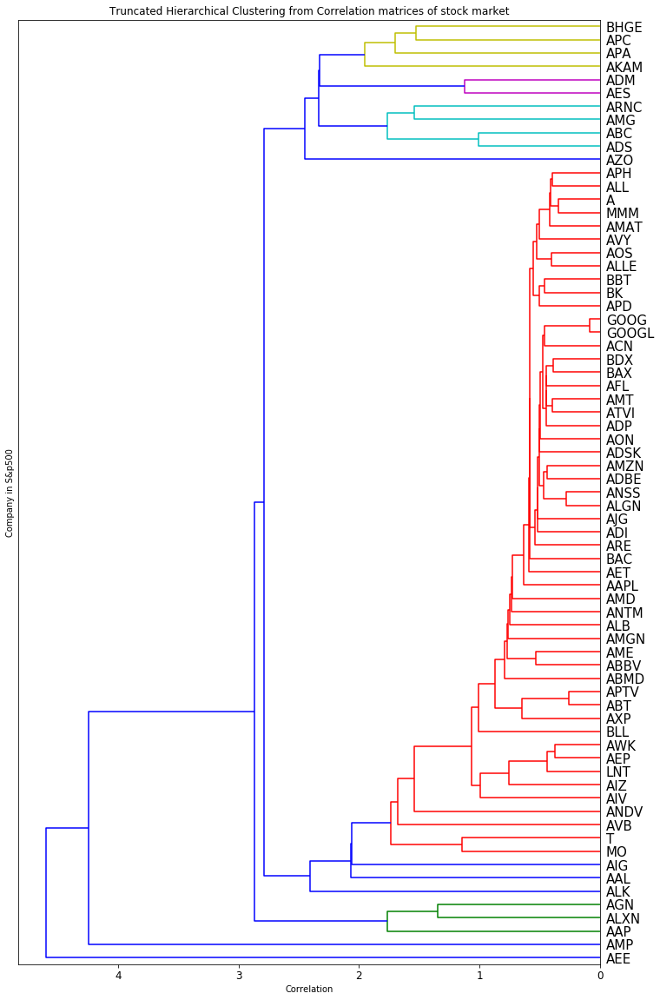

In [209]:
z2 = linkage(G,'single')

plt.figure(figsize=(12,20))

dendrogram(z2, truncate_mode='lastp',p=71,leaf_rotation=45, leaf_font_size=15, show_contracted=20,
           labels=l,color_threshold=2,orientation='left')#,link_color_func=lambda x: link_cols[x])above_threshold_color='grey'
plt.title('Truncated Hierarchical Clustering from Correlation matrices of stock market')
plt.xlabel("Correlation")
plt.ylabel('Company in S&p500')
plt.xticks(fontsize=12,rotation='horizontal')#rotation='vertical'
plt.yticks(fontsize=15,rotation='horizontal')
#plt.axhline(y=5) #how many group we have
#plt.axhline(y=150)
# plt.axhline(y=250)






plt.show()

# Generting hierarchical cluster 

In [38]:
k = 2

Hclustering = AgglomerativeClustering(n_clusters = k ,affinity='euclidean',linkage='ward')
#  affinity : dictance metric as mayor of similarity  
Hclustering.fit(x)
sm.accuracy_score(y,Hclustering.labels_)

0.78125

In [39]:
k = 2

Hclustering = AgglomerativeClustering(n_clusters = k ,affinity='euclidean',linkage='complete')
#  affinity : dictance metric as mayor of similarity  
Hclustering.fit(x)
sm.accuracy_score(y,Hclustering.labels_)

0.4375

In [42]:
k = 2

Hclustering = AgglomerativeClustering(n_clusters = k ,affinity='manhattan',linkage='average')
#  affinity : dictance metric as mayor of similarity  
Hclustering.fit(x)
sm.accuracy_score(y,Hclustering.labels_)

0.71875

# new versian 


In [ ]:
# https://python-graph-gallery.com/405-dendrogram-with-heatmap-and-coloured-leaves/

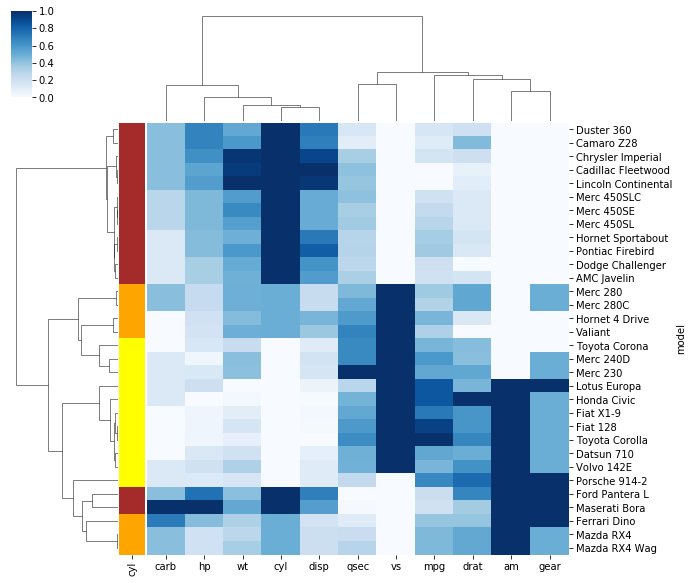

In [143]:
import seaborn as sns
import pandas as pd
from matplotlib import pyplot as plt
 
# Data set
url = 'https://python-graph-gallery.com/wp-content/uploads/mtcars.csv'
df = pd.read_csv(url)
df = df.set_index('model')
df
 
# Prepare a vector of color mapped to the 'cyl' column
my_palette = dict(zip(df.cyl.unique(), ["orange","yellow","brown"]))
row_colors = df.cyl.map(my_palette)
 
# plot
sns.clustermap(df, metric="correlation", method="single", cmap="Blues", standard_scale=1, row_colors=row_colors)


In [144]:
df.head()

,mpg,cyl,disp,hp,drat,wt,qsec,vs,am,gear,carb
model,,,,,,,,,,,
Mazda RX4,21.0,6,160.0,110,3.90,2.620,16.46,0,1,4,4
Mazda RX4 Wag,21.0,6,160.0,110,3.90,2.875,17.02,0,1,4,4
Datsun 710,22.8,4,108.0,93,3.85,2.320,18.61,1,1,4,1
Hornet 4 Drive,21.4,6,258.0,110,3.08,3.215,19.44,1,0,3,1
Hornet Sportabout,18.7,8,360.0,175,3.15,3.440,17.02,0,0,3,2


In [ ]:
#

In [210]:
#sklearn

#import sklearn.metrics as sm
#from sklearn.cluster import AgglomerativeClustering 



In [272]:
k = 10 # 10
## manhattan
Q_ave = AgglomerativeClustering(n_clusters = k ,affinity='manhattan',
                                       linkage='average')
Q_com = AgglomerativeClustering(n_clusters = k ,affinity='manhattan',
                                       linkage='complete')

Q_ward = AgglomerativeClustering(n_clusters = k ,affinity='euclidean',
                                       linkage='ward')
#Q = AgglomerativeClustering(n_clusters = k ,affinity='manhattan',linkage='ward')
x_ave = G.ix[:,:].values
Q_ave.fit(x_ave)
y_ave = Q_ave.labels_

x_com = G.ix[:,:].values
Q_com.fit(x_com)
y_com = Q_ave.labels_

x_ward = G.ix[:,:].values
Q_ward.fit(x_ward)
y_ward = Q_ave.labels_
#print(y,len(y))


In [304]:



#print(df)
df = pd.DataFrame(G.columns)
df['group_averege'] = y_ave
df['group_complate'] = y_com
df['group_ward'] = y_ward
df.columns = ['Company','group_average','group_complate','group_ward'] #'group_complate'



df['group_ward'].head(71)

0     0
1     0
2     0
3     0
4     0
5     0
6     0
7     0
8     9
9     1
10    0
11    2
12    0
13    0
14    0
15    2
16    6
17    0
18    0
19    9
20    0
21    0
22    9
23    4
24    0
25    0
26    0
27    0
28    8
29    0
     ..
41    0
42    4
43    0
44    0
45    0
46    0
47    0
48    0
49    3
50    8
51    0
52    0
53    0
54    1
55    2
56    0
57    0
58    8
59    0
60    0
61    3
62    8
63    0
64    4
65    0
66    0
67    0
68    0
69    0
70    0
Name: group_ward, Length: 71, dtype: int64

In [315]:
from sklearn.cluster import DBSCAN, KMeans  

In [318]:
# it doesn't useful

x = G.ix[:,:].values
dbscan = DBSCAN()
dbscan.fit(x)
y_dbscan = dbscan.labels_
print(y_dbscan)

[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]


In [321]:
k = 10

x = G.ix[:,:].values
k_mean = KMeans(n_clusters=k)
k_mean.fit(x)
y_k_mean = k_mean.labels_
print(y_k_mean)

[9 0 9 0 9 9 0 4 3 2 9 1 0 9 9 1 5 9 0 3 0 9 3 1 4 9 9 9 4 0 6 5 4 0 5 9 4
 7 1 9 9 9 1 0 0 0 9 9 9 8 4 0 9 0 2 1 9 4 5 0 0 8 5 9 1 4 9 9 0 9 9]


In [213]:
x = G.ix[:,:].values
x

array([[ 1.    ,  0.7749,  0.8721, ...,  0.9348,  0.8644,  0.9374],
       [ 0.7749,  1.    ,  0.9339, ...,  0.8258,  0.8453,  0.8099],
       [ 0.8721,  0.9339,  1.    , ...,  0.8911,  0.8797,  0.8896],
       ..., 
       [ 0.9348,  0.8258,  0.8911, ...,  1.    ,  0.8942,  0.9831],
       [ 0.8644,  0.8453,  0.8797, ...,  0.8942,  1.    ,  0.8987],
       [ 0.9374,  0.8099,  0.8896, ...,  0.9831,  0.8987,  1.    ]])

In [266]:
import networkx as nx

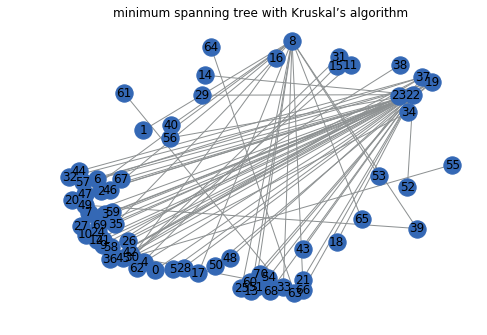

In [271]:
import networkx as nx

df_corr = pd.read_csv('stock_corrleation.csv',index_col=0)
G_oo = nx.from_numpy_matrix(df_corr.values) 
# Calculate minimum spanning tree
mst = nx.minimum_spanning_tree(G_oo) 

nx.draw(mst, edge_color="#8D9192",node_color='#3468B5',with_labels=df_corr.head)
plt.title("minimum spanning tree with Kruskal’s algorithm")

plt.show()

In [312]:
list1 = [i for i in range(len(G.columns))]
lab = dict(zip(list1,G.columns))#"#8D9192"

In [313]:
# font_color='red'

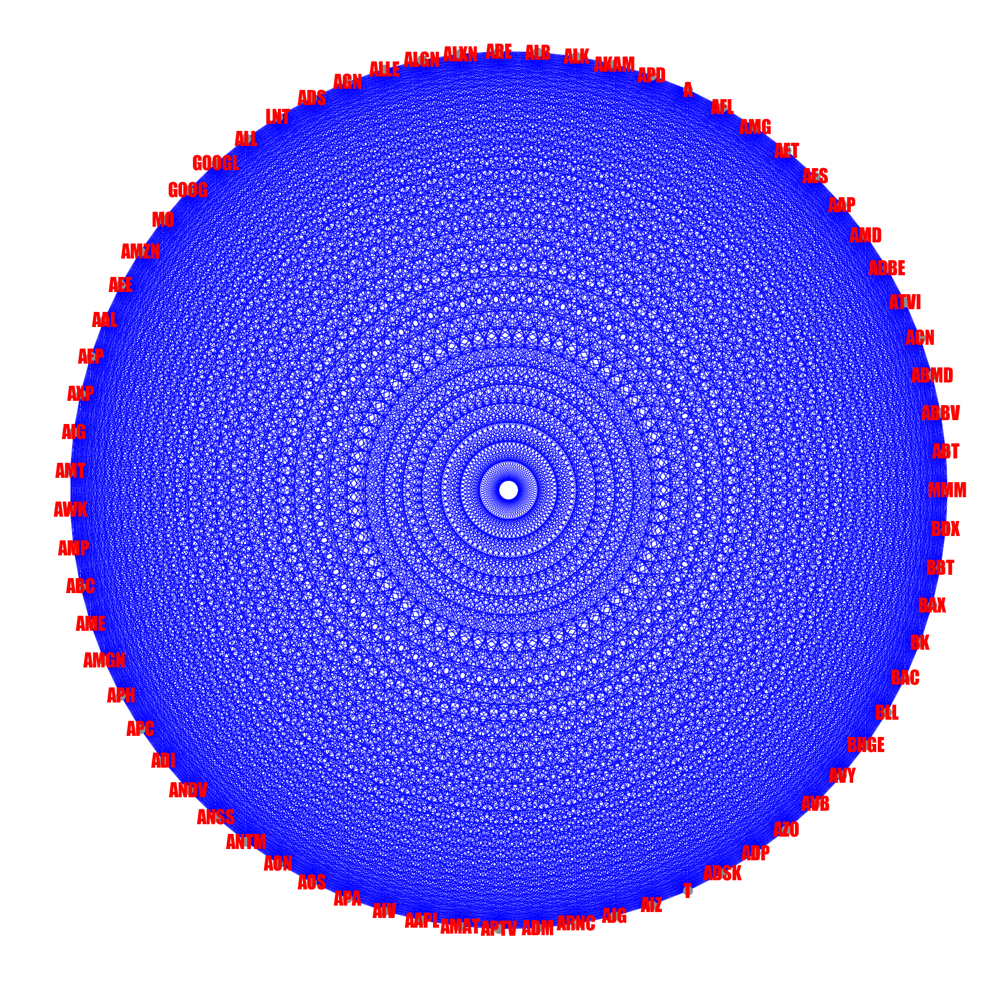

In [314]:
plt.figure(figsize=(25,25))
nx.draw_circular(G_oo,node_color="#8D9192", edge_color="blue",labels=lab, font_size=34,
                 font_color='red',font_family='impact')#edge_cmap=df['group_ward']

In [ ]:
#y_k_mean

In [322]:
cmaps = ['Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds',
         'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu',
         'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn']

In [350]:
cmaps_num_color = [i for i in range(len(cmaps))]

cmaps_dic = dict(zip(cmaps_num_color,cmaps))

list_color =[]
for i in range(len(y_k_mean)):
    for j in range(len(cmaps)):
        if y_k_mean[i] == cmaps_num_color[j] :
            list_color.append(cmaps[j])
            
lab_label = dict(zip(cmaps_num_color,y_k_mean))

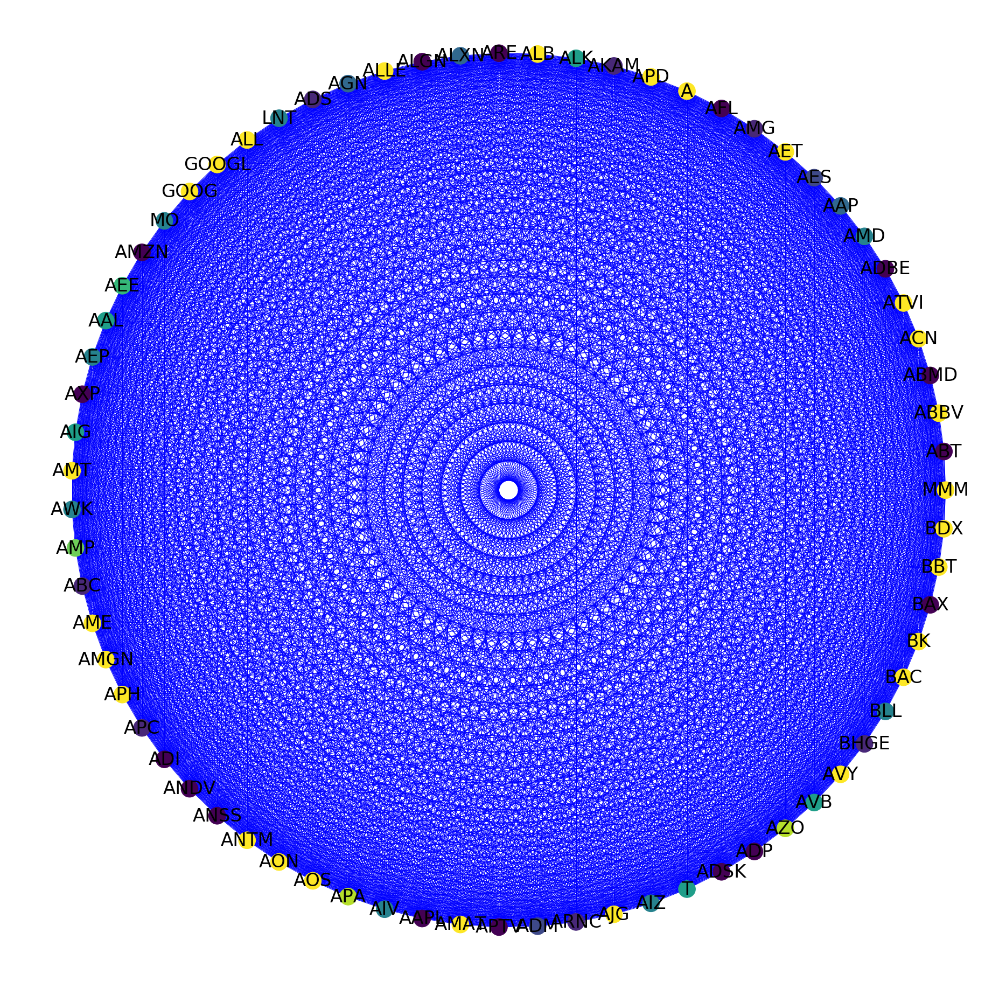

In [349]:
plt.figure(figsize=(25,25))
#nx.drawing.nx_pylab.draw_networkx
nx.draw_circular(G_oo,node_color=y_k_mean,node_size=1000, edge_color="blue",labels=lab,font_size=34)#edge_cmap=df['group_ward']

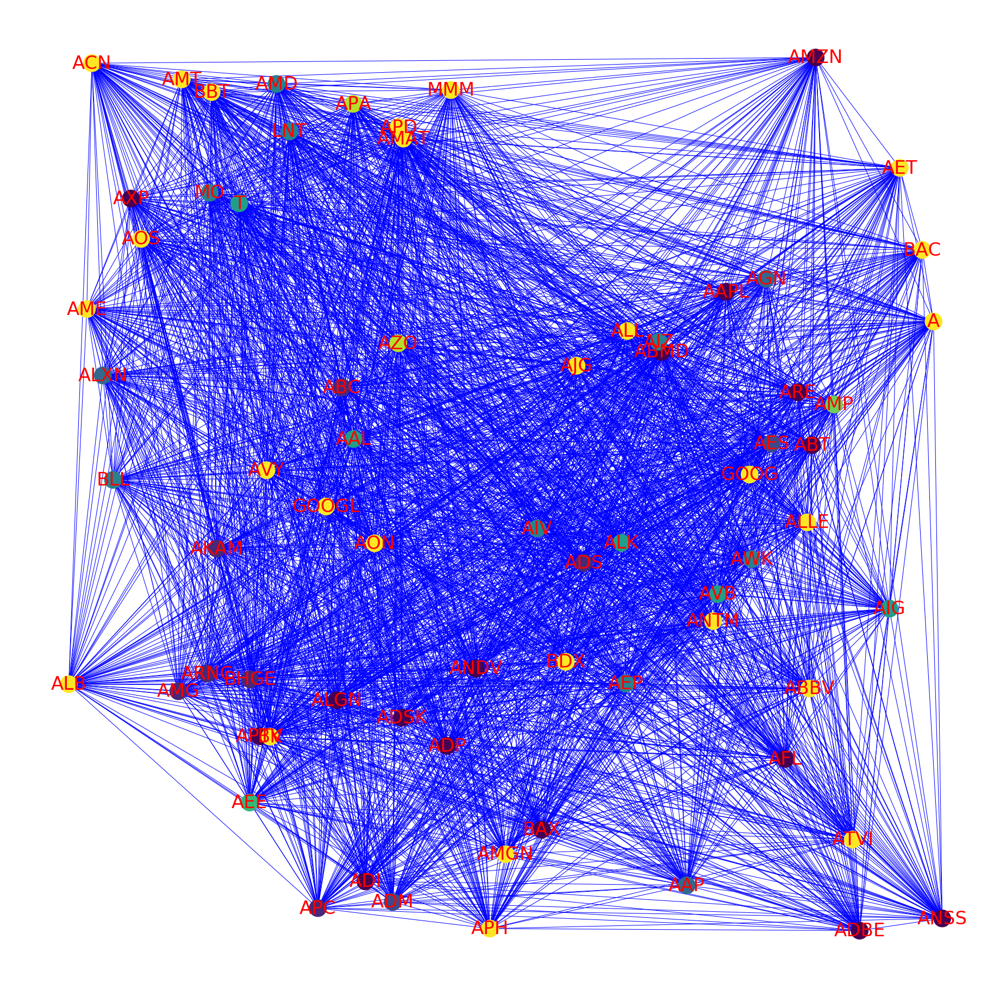

In [369]:
#nx.draw_shell
plt.figure(figsize=(25,25))
#nx.drawing.nx_pylab.draw_networkx
nx.draw_random(G_oo,node_color=y_k_mean,
                 node_size=1000, edge_color="blue",labels=lab,font_size=34,font_color="red")#edge_cmap=df['group_ward']

{0: Text(0.216827,-0.0787342,'MMM'),
 1: Text(0.153451,-0.0654395,'ABT'),
 2: Text(0.207276,-0.116989,'ABBV'),
 3: Text(0.180008,-0.154712,'ABMD'),
 4: Text(0.156043,-0.0972637,'ACN'),
 5: Text(0.214298,-0.133101,'ATVI'),
 6: Text(0.176251,-0.137079,'ADBE'),
 7: Text(0.217955,-0.0989993,'AMD'),
 8: Text(-0.905843,0.444488,'AAP'),
 9: Text(-0.029093,0.0320184,'AES'),
 10: Text(0.194703,-0.104544,'AET'),
 11: Text(-0.684439,0.570455,'AMG'),
 12: Text(0.204611,-0.10702,'AFL'),
 13: Text(0.219419,-0.092747,'A'),
 14: Text(0.164691,-0.103175,'APD'),
 15: Text(-0.735154,0.312834,'AKAM'),
 16: Text(0.162296,-0.0583269,'ALK'),
 17: Text(0.158783,-0.0678939,'ALB'),
 18: Text(0.17038,-0.0772726,'ARE'),
 19: Text(-0.665289,0.649639,'ALXN'),
 20: Text(0.18321,-0.142362,'ALGN'),
 21: Text(0.171994,-0.0808438,'ALLE'),
 22: Text(-0.956765,0.210746,'AGN'),
 23: Text(-0.93652,0.486291,'ADS'),
 24: Text(0.155248,-0.14949,'LNT'),
 25: Text(0.19478,-0.0920399,'ALL'),
 26: Text(0.162477,-0.0696986,'GOOGL')

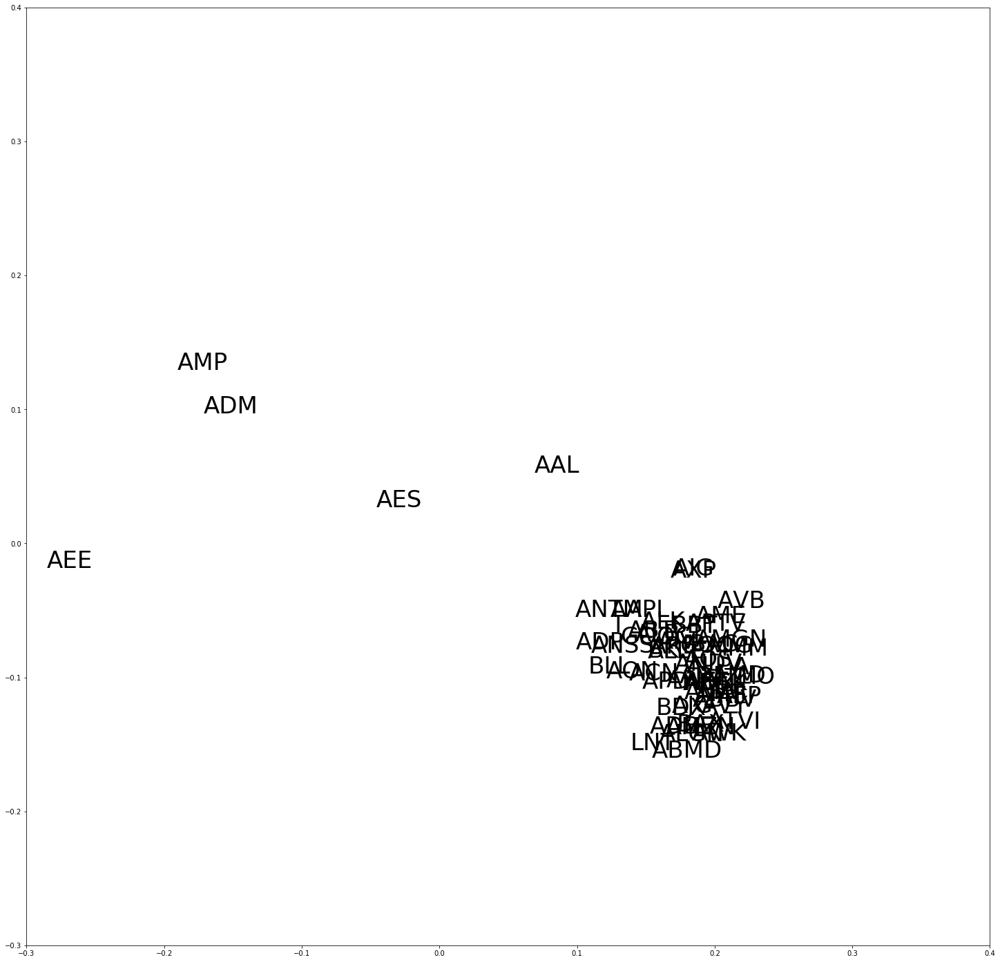

In [363]:
#lab_label
plt.figure(figsize=(25,25))
pos=nx.spring_layout(G_oo)
plt.xlim(-0.3,0.4)
plt.ylim(-0.3,0.4)
nx.draw_networkx_labels(G_oo,pos,lab=lab_label,
                        node_color=y_k_mean,node_size=1000, edge_color="blue",labels=lab,font_size=34)

{0: Text(-0.137123,-0.0718652,'0'),
 1: Text(-0.160383,-0.0708164,'1'),
 2: Text(-0.160894,-0.104604,'2'),
 3: Text(-0.159387,0.0542022,'3'),
 4: Text(-0.202831,-0.00046934,'4'),
 5: Text(-0.148646,0.0252345,'5'),
 6: Text(-0.215871,0.0107627,'6'),
 7: Text(-0.212515,0.041945,'7'),
 8: Text(0.882258,0.45616,'8'),
 9: Text(0.0718162,0.0668229,'9'),
 10: Text(-0.193088,-0.0222284,'10'),
 11: Text(0.856016,-0.176371,'11'),
 12: Text(-0.203488,0.00654795,'12'),
 13: Text(-0.153392,-0.0549857,'13'),
 14: Text(-0.173633,-0.0624135,'14'),
 15: Text(0.783856,0.11354,'15'),
 16: Text(-0.197666,-0.0752866,'16'),
 17: Text(-0.177571,-0.0272843,'17'),
 18: Text(-0.182727,0.0174408,'18'),
 19: Text(0.586439,0.499493,'19'),
 20: Text(-0.201944,-0.00574035,'20'),
 21: Text(-0.169157,-0.00933984,'21'),
 22: Text(0.602585,-0.114946,'22'),
 23: Text(0.956321,0.0305445,'23'),
 24: Text(-0.211148,0.0843024,'24'),
 25: Text(-0.151414,-0.0357233,'25'),
 26: Text(-0.155051,0.0241582,'26'),
 27: Text(-0.20617

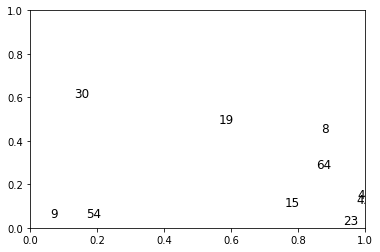

In [357]:
#plt.xlim(0,0.4)
nx.draw_networkx_labels(G_oo, pos=nx.spring_layout(G_oo))